<a href="https://colab.research.google.com/github/RennamFariaUNIFESP/Aeral_Scenes_Classification/blob/main/Aeral_Scenes_Classification_RennamFaria_164933.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Using deep learning and neural network convolutional

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F   # define NN architecture
import torchvision
from torchvision import models
from torchvision import transforms
import numpy as np

from PIL import Image

from torchvision import datasets



In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

num_epochs = 50
batch_size = 32
learning_rate = 0.01

numb_class = 21
numb_images = 100     # * numb_classes = total(2100)
image_size = 256      # 256 x 256 pixel

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
classes = ('agricultural',
            'airplane',
            'baseballdiamond',
            'beach',
            'buildings',
            'chaparral',
            'denseresidential',
            'forest',
            'freeway',
            'golfcourse',
            'harbor',
            'intersection',
            'mediumresidential',
            'mobilehomepark',
            'overpass',
            'parkinglot',
            'river',
            'runway'
            'sparseresidential'
            'storagetanks'
            'tenniscourt')


In [ ]:
import torch
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, Subset

data_dir = '/content/drive/MyDrive/IA/Data/Aeral_UC_Merced_Land/UCMerced_LandUse/Images'

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

#Catching the dataset on folder in drive
dataset = datasets.ImageFolder(root=data_dir, transform=transform)

print(dataset[0])

def convert_label(label):
    return int(label)

#Dicionary from each label in folder
train_counts = {i: 0 for i in range(len(dataset.classes))}
test_counts = {i: 0 for i in range(len(dataset.classes))}

train_size = int(0.8 * len(dataset))
test_size = len(dataset) - train_size

train_indices = []
test_indices = []

#Adding in train and test the labels of each image
for i, (image, label) in enumerate(dataset.imgs):
    label = convert_label(label)
    if train_counts[label] < 0.8 * 100:  # 80%
        train_indices.append(i)
        train_counts[label] += 1
    else:
        test_indices.append(i)
        test_counts[label] += 1

data_train = Subset(dataset, train_indices)
data_test = Subset(dataset, test_indices)

print("Contagem de amostras por classe no conjunto de treinamento:")
print(train_counts)
print("\nContagem de amostras por classe no conjunto de teste:")
print(test_counts)

(tensor([[[-1.3473, -1.2617, -1.2788,  ..., -0.2342,  0.1083,  0.0056],
         [-1.3987, -1.3473, -1.3130,  ..., -0.6623, -0.2513,  0.0056],
         [-1.3815, -1.3644, -1.3130,  ..., -0.3712, -0.2684, -0.2856],
         ...,
         [ 1.2214,  1.4269,  1.8208,  ...,  0.1939,  0.1939, -0.1143],
         [ 0.2796,  0.7591,  1.1529,  ..., -0.0116,  0.0741,  0.1083],
         [ 0.0227, -0.0287,  0.3481,  ..., -0.2856, -0.3369,  0.1083]],

        [[-1.3004, -1.2129, -1.2479,  ..., -0.1099,  0.2402,  0.1176],
         [-1.3529, -1.3004, -1.2654,  ..., -0.4951, -0.1099,  0.1001],
         [-1.3529, -1.3179, -1.2654,  ..., -0.1450, -0.0224, -0.1275],
         ...,
         [ 1.3606,  1.5882,  1.9559,  ...,  0.3102,  0.3277, -0.0049],
         [ 0.3277,  0.8529,  1.2906,  ...,  0.1001,  0.1527,  0.1877],
         [-0.0049, -0.0399,  0.3803,  ..., -0.1450, -0.2675,  0.1352]],

        [[-1.0027, -0.8807, -0.9156,  ...,  0.0605,  0.3742,  0.2173],
         [-1.0550, -1.0201, -0.9678,  ..., -

In [ ]:
print(len(data_train))
print(len(data_test))

print(data_train[400])
print()
print(data_test[400])

1680
420
(tensor([[[ 0.6563,  0.5707,  0.6049,  ...,  0.8789,  0.9132,  0.8961],
         [ 0.5536,  0.5878,  0.7077,  ...,  0.7591,  0.7419,  0.7933],
         [ 0.4679,  0.6563,  0.7933,  ...,  0.7248,  0.6221,  0.6563],
         ...,
         [ 0.6049,  0.6906,  0.6734,  ...,  0.2111,  0.5536,  0.5878],
         [ 0.7933,  0.8447,  0.7419,  ..., -0.0116,  0.2796,  0.5022],
         [ 0.6734,  0.6734,  0.6734,  ...,  0.0912,  0.2624,  0.5364]],

        [[ 0.5378,  0.5028,  0.5728,  ...,  0.7479,  0.6954,  0.7129],
         [ 0.4853,  0.5378,  0.6779,  ...,  0.7304,  0.6254,  0.6078],
         [ 0.5903,  0.6779,  0.7129,  ...,  0.6254,  0.5553,  0.6078],
         ...,
         [ 0.3978,  0.4328,  0.6254,  ...,  0.0126,  0.4328,  0.5553],
         [ 0.4503,  0.3452,  0.5903,  ..., -0.1450,  0.2052,  0.4853],
         [ 0.4503,  0.3803,  0.5203,  ..., -0.0399,  0.1702,  0.3978]],

        [[ 0.3219,  0.3568,  0.5311,  ...,  0.3045,  0.3742,  0.1999],
         [ 0.3568,  0.5659,  0.7925

In [ ]:
print(len(dataset))

2100


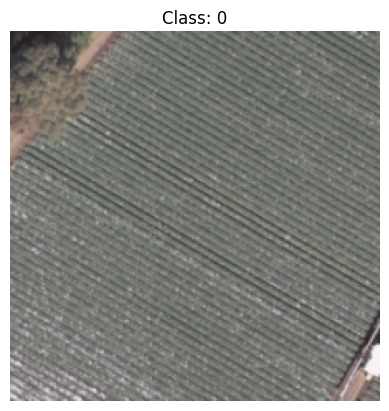

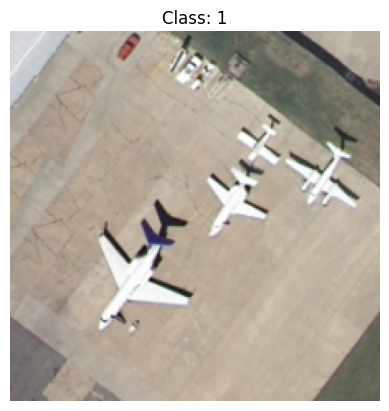

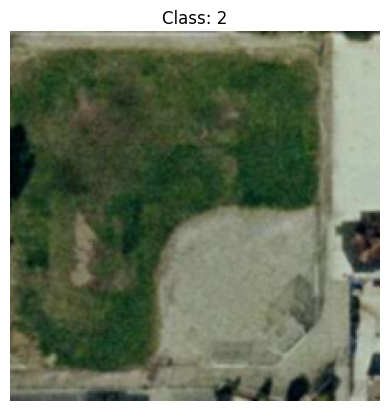

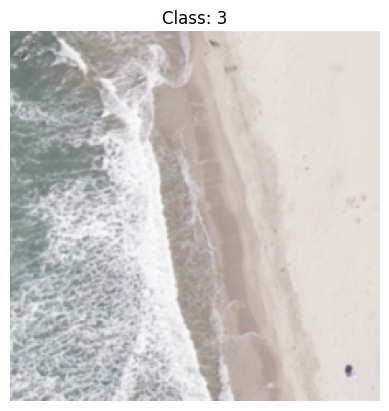

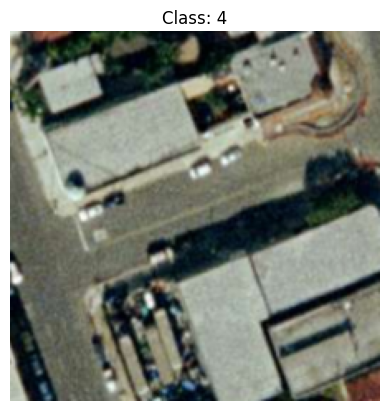

...

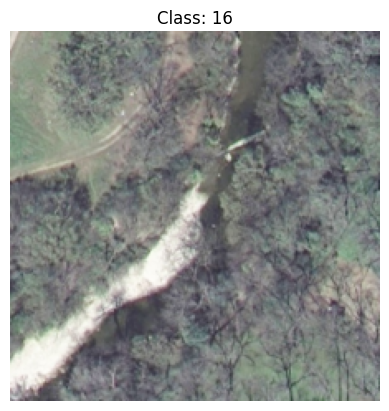

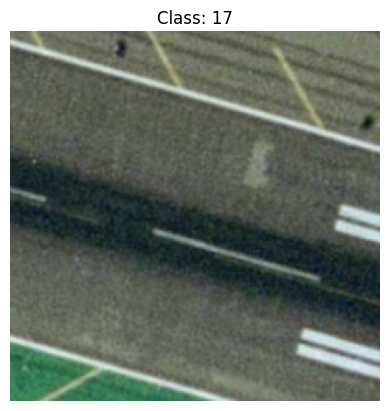

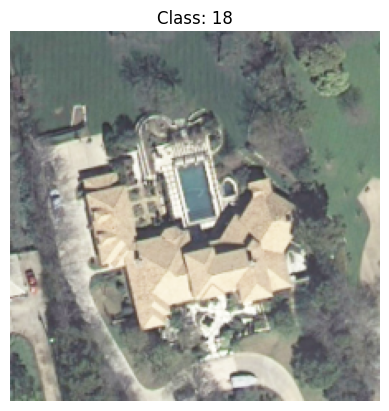

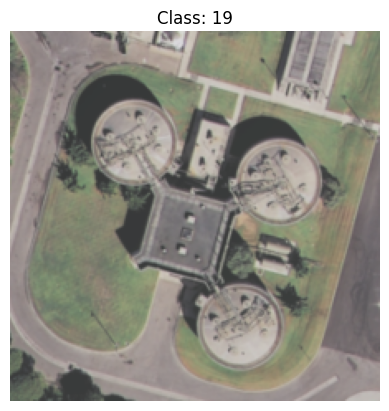

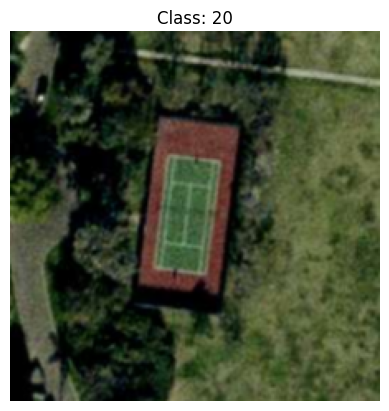

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import torchvision.transforms.functional as TF

mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])
#denormalize the image and show the original

for index in range(21):
    image, label = data_train[index*80]

    image = image.numpy().transpose((1, 2, 0))
    image = std * image + mean
    image = np.clip(image, 0, 1)

    plt.imshow(image)
    plt.title(f"Class: {label}")
    plt.axis('off')
    plt.show()

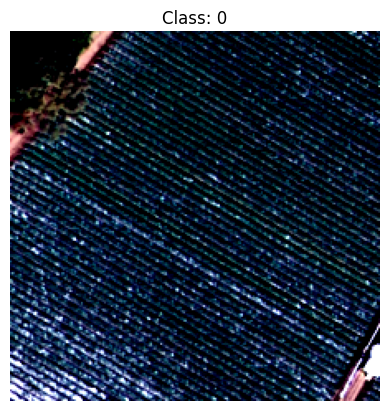

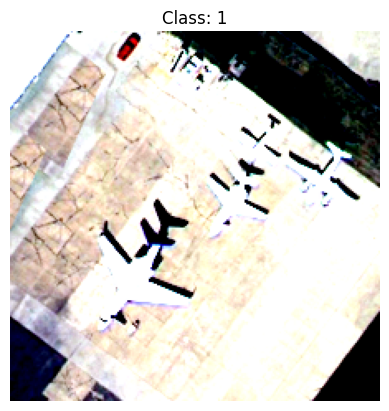

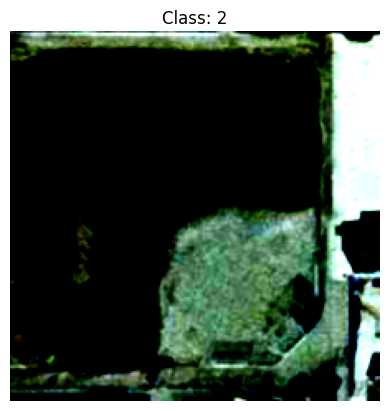

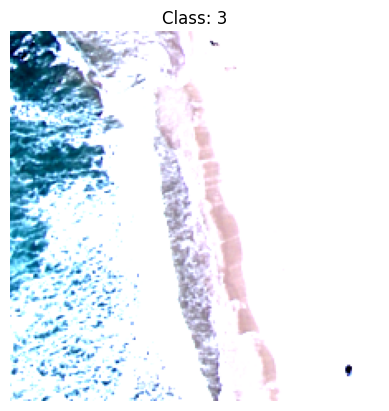

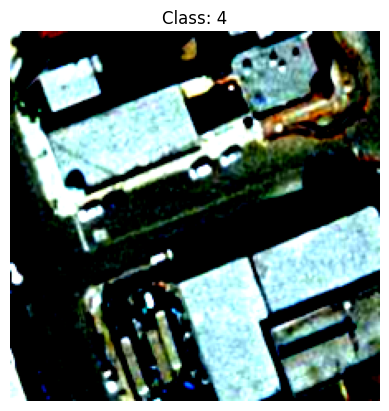

...

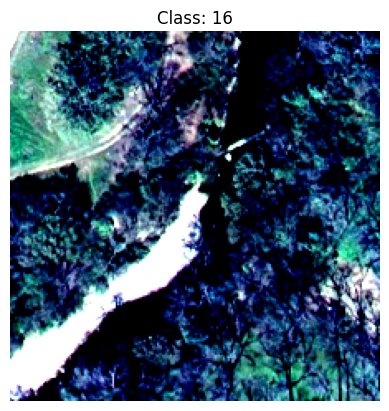

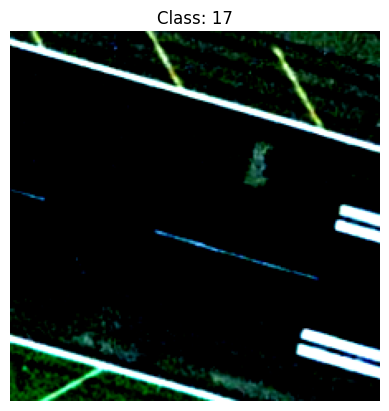

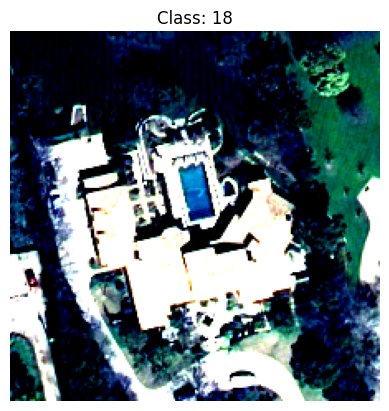

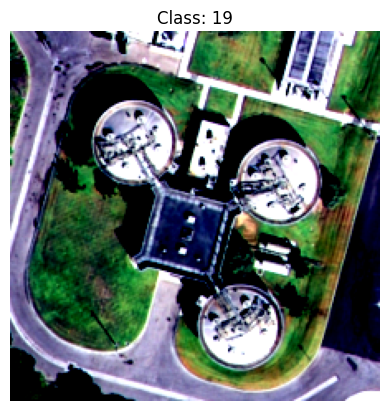

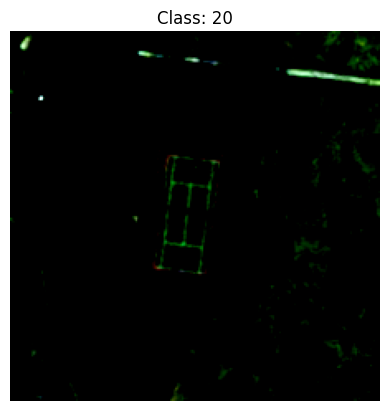

In [ ]:
import matplotlib.pyplot as plt

for index in range(21):
  image, label = data_train[index*80]

  image = image.numpy().transpose((1, 2, 0))

  plt.imshow(image)
  plt.title(f"Class: {label}")
  plt.axis('off')
  plt.show()

In [ ]:
import torch

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

if device.type == "cuda":
    print("Using GPU:", torch.cuda.get_device_name(0))
else:
    print("Using CPU")

Using CPU


In [ ]:
import torch
from torch.utils.data import Dataset

if isinstance(data_train, Dataset):
    print("data_train its instance of Dataset.")
else:
    print("data_train its not instance of Dataset.")

if isinstance(data_test, Dataset):
    print("data_test its instance of Dataset.")
else:
    print("data_test its not instance of Dataset.")

data_train its instance of Dataset.
data_test its instance of Dataset.


In [ ]:
import torch
import torchvision.models as models
import torch.nn as nn

vgg16 = models.vgg16(pretrained=False)

num_classes = 21

vgg16.classifier[6] = nn.Linear(in_features=4096, out_features = num_classes)

vgg16.train()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [ ]:
import torch

class VGG16Trainer:
    def __init__(self, model, train_loader, test_loader, criterion, optimizer, device=torch.device('cpu')):
        self.model = model
        self.train_loader = train_loader
        self.test_loader = test_loader
        self.criterion = criterion
        self.optimizer = optimizer
        self.device = device
        self.model.to(self.device)

    def train(self, num_epochs):
        loss_list = []
        for epoch in range(num_epochs):
            self.model.train()
            running_loss = 0.0

            for i, (inputs, labels) in enumerate(self.train_loader):
                inputs, labels = inputs.to(self.device), labels.to(self.device)
                self.optimizer.zero_grad()
                outputs = self.model(inputs)

                loss = self.criterion(outputs, labels)
                loss.backward()
                self.optimizer.step()

                running_loss += loss.item() * inputs.size(0)

            epoch_loss = running_loss / len(self.train_loader.dataset)
            loss_list.append(epoch_loss)

            print(f'Epoch [{epoch+1}/{num_epochs}], Training Loss: {epoch_loss:.4f}')

        return loss_list

    def test(self):
        self.model.eval()
        correct = 0
        total = 0

        with torch.no_grad():
            for inputs, labels in self.test_loader:
                inputs, labels = inputs.to(self.device), labels.to(self.device)
                outputs = self.model(inputs)
                _, predicted = torch.max(outputs, 1)
                total += labels.size(0)
                correct += (predicted == labels).sum().item()

        test_accuracy = correct / total
        test_accuracy = test_accuracy * 100
        print(f'Test Accuracy: {test_accuracy:.2f}%')

        return test_accuracy

    def save_model(self, path):
        torch.save(self.model.state_dict(), path)

In [ ]:
import torch
import torchvision.models as models
import torch.nn as nn
import torch.optim as optim

#From Scratch
vgg16 = models.vgg16(pretrained=False)

num_features = vgg16.classifier[6].in_features
vgg16.classifier[6] = nn.Linear(4096, 21)
#

train_loader = DataLoader(data_train, batch_size=32, shuffle=True)
test_loader = DataLoader(data_test, batch_size=32)

criterion = nn.CrossEntropyLoss()

optimizer = optim.SGD(vgg16.parameters(), lr=0.01)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
vgg16.to(device)

num_epochs = 50

trainer = VGG16Trainer(model=vgg16,
                           train_loader=train_loader,
                           test_loader=test_loader,
                           criterion=criterion,
                           optimizer=optimizer,
                           device=device)

loss_scratch = trainer.train(num_epochs)
acc_scratch = trainer.test()
#trainer.save_model('/content/drive/MyDrive/IA/Models/Aeral/vgg16_from_scratch.pth')

In [ ]:
import torch
import torchvision.models as models
import torch.nn as nn
import torch.optim as optim

#Transfer learning all freeze, except last FC
vgg16 = models.vgg16(pretrained=True)

for param in vgg16.parameters():
    param.requires_grad = False

vgg16.classifier[6].requires_grad = True  #last FC
num_features = vgg16.classifier[6].in_features
vgg16.classifier[6] = nn.Linear(4096, 21)
#

train_loader = DataLoader(data_train, batch_size=64, shuffle=True)
test_loader = DataLoader(data_test, batch_size=64)

criterion = nn.CrossEntropyLoss()

optimizer = optim.SGD(vgg16.parameters(), lr=0.01)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
vgg16.to(device)

num_epochs = 50

pretreined_FC = VGG16Trainer(model=vgg16,
                           train_loader=train_loader,
                           test_loader=test_loader,
                           criterion=criterion,
                           optimizer=optimizer,
                           device=device)

loss_pretreined_FC = pretreined_FC.train(num_epochs)
acc_pretreined_FC = pretreined_FC.test()
#pretreined_FC.save_model('/content/drive/MyDrive/IA/Models/Aeral/vgg16_pretreined_with_FC.pth')

In [ ]:
import torch
import torchvision.models as models
import torch.nn as nn
import torch.optim as optim

#Transfer learning all freeze, except last convolutional and last FC
vgg16 = models.vgg16(pretrained=True)

for param in vgg16.parameters():
    param.requires_grad = False

for param in vgg16.features[-4:].parameters():
    param.requires_grad = True   #last convolutional

vgg16.classifier[6].requires_grad = True  #last FC
num_features = vgg16.classifier[6].in_features
vgg16.classifier[6] = nn.Linear(4096, 21)
#

train_loader = DataLoader(data_train, batch_size=64, shuffle=True)
test_loader = DataLoader(data_test, batch_size=64)

criterion = nn.CrossEntropyLoss()

optimizer = optim.SGD(vgg16.parameters(), lr=0.01)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
vgg16.to(device)

num_epochs = 50

pretreined_Conv_FC = VGG16Trainer(model=vgg16,
                           train_loader=train_loader,
                           test_loader=test_loader,
                           criterion=criterion,
                           optimizer=optimizer,
                           device=device)

loss_pretreined_Conv_FC = pretreined_Conv_FC.train(num_epochs)
acc_pretreined_Conv_FC = pretreined_Conv_FC.test()
#pretreined_Conv_FC.save_model('/content/drive/MyDrive/IA/Models/Aeral/vgg16_pretreined_with_convolutional_and_FC.pth')

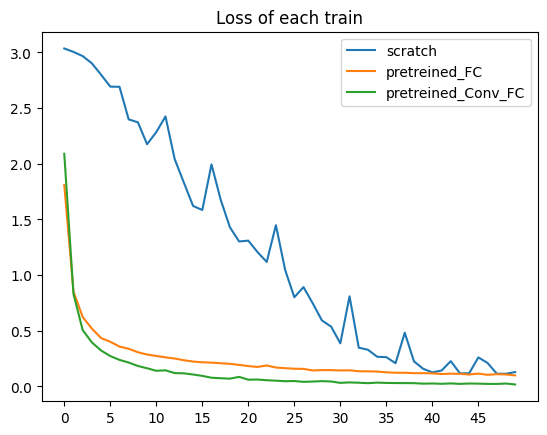

In [ ]:
import matplotlib.pyplot as plt

epoch_num = list(range(50))

plt.title("Loss of each train")

#loss_scratch, loss_pretreined_FC, loss_pretreined_Conv_FC
plt.plot(epoch_num, loss_scratch, label="scratch")
plt.plot(epoch_num, loss_pretreined_FC, label="pretreined_FC")
plt.plot(epoch_num, loss_pretreined_Conv_FC, label="pretreined_Conv_FC")

plt.xticks(epoch_num[::5], epoch_num[::5])

plt.legend()

plt.show()

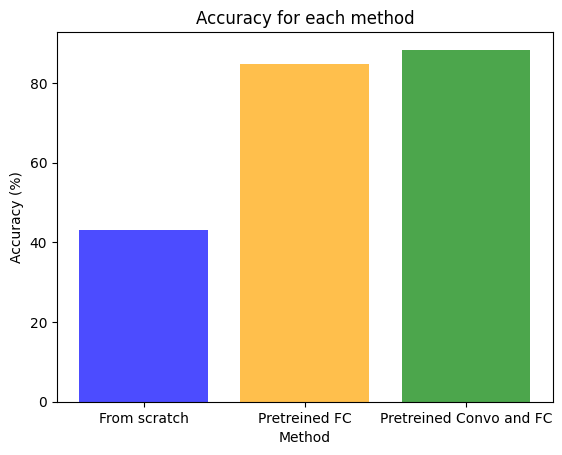

In [ ]:
import matplotlib.pyplot as plt

accuracies = [acc_scratch, acc_pretreined_FC, acc_pretreined_Conv_FC]
classes = ['From scratch', 'Pretreined FC', 'Pretreined Convo and FC']

num_classes = len(accuracies)

x = range(num_classes)

plt.bar(x, accuracies, align='center', alpha=0.7, color = ['blue', 'orange', 'green'])

plt.xticks(x, classes)

plt.xlabel('Method')
plt.ylabel('Accuracy (%)')
plt.title('Accuracy for each method')

plt.show()